In [100]:
import pandas as pd
import numpy as np
from datetime import datetime as dt
import os
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import mpld3
import re
import math
from v_finite_polygons import voronoi_finite_polygons_2d
from scipy.spatial import Voronoi, voronoi_plot_2d
from matplotlib.patches import Polygon, Patch
import matplotlib.image as mpimg
from matplotlib.ticker import ScalarFormatter
from fillDf import fillDf

In [101]:
InteriorSensors = {
'B-01':[1.85,1],
'B-02':[1.85,1],
'B-04':[4.5,1],
'B-05':[7.5,1],
'B-06':[7.5,1],
'B-07':[4.5,2],
'B-08':[6,2.5],
'B-09':[9,2],
'B-10':[4.9,3],
'B-11':[7.6,3.3],
'B-12':[7.6,3.3],
'B-14':[3.7,3],
'B-15':[3.7,3],
'B-16':[9,4],
'B-17':[4.9,5],
'B-18':[1.85,6],
'B-19':[4.5,6],
'B-20':[4.5,6],
'B-21':[7.6,5.5],
'B-22':[7.6,5.5],
'B-23':[4.5,0.3]
}

In [102]:
expTimes = [
    pd.Timestamp("2020-08-08 11:22:51"),
    pd.Timestamp("2020-08-08 11:36:01"),
    pd.Timestamp("2020-08-08 11:52:01"),
    pd.Timestamp("2020-08-08 12:00:11"),
    pd.Timestamp("2020-08-08 12:11:01"),
    pd.Timestamp("2020-08-08 12:20:51"),
    pd.Timestamp("2020-08-08 12:36:01"),
    pd.Timestamp("2020-08-08 12:51:21"),
    pd.Timestamp("2020-08-08 13:06:01")
    ]


In [103]:
AutoZoneAssignments

,HMC Expirement 1,HMC Expirement 2,HMC Expirement 3
0,0,0,0
1,0,0,1
2,0,0,0
3,0,0,0
4,0,0,0
5,0,0,0
6,1,1,0
7,0,1,1
8,0,0,0
9,0,0,0


In [104]:
ZoneAssignments = pd.read_csv('./dataInfo/ZoneAssignments.csv')
key = list(ZoneAssignments.keys())[0]
numZones = len(set(ZoneAssignments[key]))
AutoZoneAssignments = pd.read_csv('./dataInfo/AutoZoneAssignments.csv')
key = list(AutoZoneAssignments.keys())[0]
numZones = len(set(AutoZoneAssignments[key]))
allFiles = glob.glob("./interpolatedData/*.csv")
avgData = glob.glob("./stretchedAvgData/*.csv")
avgDataAuto = glob.glob("./stretchedAvgDataAuto/*.csv")
expData = glob.glob("./stretchedExpirementData/*.csv")
expDataAuto = glob.glob("./stretchedExpirementDataAuto/*.csv")
df = {}
for x in allFiles:
    name = x.split('\\')[1].split('.')[0]
    df[name] = pd.read_csv(x,parse_dates=[0])
mergedData = pd.read_csv('./mergedData/mergedFrame.csv',parse_dates=[0])
stAvgDf = {}
for x in avgData:
    name = x.split('\\')[1].split('.')[0]
    stAvgDf[name] = pd.read_csv(x)
stAvgDfAuto = {}
for x in avgDataAuto:
    name = x.split('\\')[1].split('.')[0]
    stAvgDfAuto[name] = pd.read_csv(x)
stExpDf = {}
for x in expData:
    name = x.split('\\')[1].split('.')[0]
    stExpDf[name] = pd.read_csv(x)
stExpDfAuto = {}
for x in expDataAuto:
    name = x.split('\\')[1].split('.')[0]
    stExpDfAuto[name] = pd.read_csv(x)

2020-08-08 11:23:01
2020-08-08 11:36:11
2020-08-08 11:52:11
2020-08-08 12:00:21
2020-08-08 12:11:11
2020-08-08 12:21:01
2020-08-08 12:36:11
2020-08-08 12:51:31
2020-08-08 13:06:11


Text(0.5, 1.0, 'Variance in Particles')

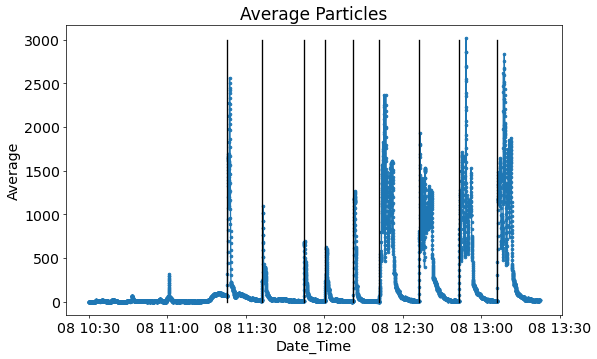

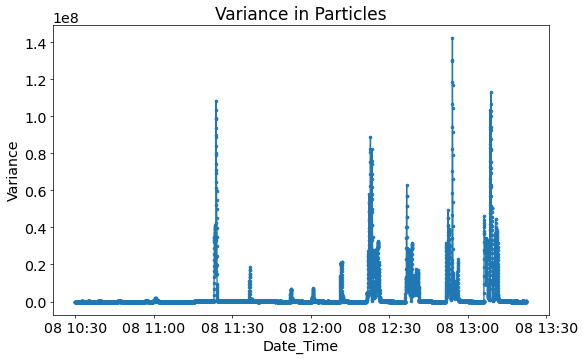

In [105]:
split = len(mergedData)

fig = plt.figure(0, figsize=(10,6), dpi=64)
ax = fig.gca()
ax.plot(mergedData['Date_Time'][:split],mergedData['Average'][:split],'.-')
ax.set_xlabel(mergedData.columns[0])
ax.set_ylabel('Average')
plt.title('Average Particles')

prev = 0
for idx,i in enumerate(mergedData['Average']):
    if (prev+1)*2 < i:
        ax.plot([mergedData['Date_Time'][idx]]*2,[0,3000],color = 'black')
        print(mergedData['Date_Time'][idx])
    prev = i

fig = plt.figure(2, figsize=(10,6), dpi=64)
ax = fig.gca()
ax.plot(mergedData['Date_Time'][:split],mergedData['Variance'][:split],'.-')
ax.set_xlabel(mergedData.columns[0])
ax.set_ylabel('Variance')
plt.title('Variance in Particles')

# fig = plt.figure(1, figsize=(10,6), dpi=64)
# ax = fig.gca()
# ax.plot(mergedData['Date_Time'][split:],np.log(mergedData['Average'][split:])/np.log(3),'.-')
# ax.set_xlabel(mergedData.columns[0])
# ax.set_ylabel('Average')
# plt.title('Average Particles')

# fig = plt.figure(4, figsize=(10,6), dpi=64)
# ax = fig.gca()
# ax.plot(mergedData['Date_Time'][split:],np.log(mergedData['Variance'])[split:],'.-')
# ax.set_xlabel(mergedData.columns[0])
# ax.set_ylabel('Variance')
# plt.title('Variance in Particles')

In [106]:
# These are the "Tableau 20" colors as RGB.    
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),    
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),    
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),    
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),    
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229),
             (31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),    
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),    
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),    
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),    
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]  
             # copied it to itself so now its the tableu 40 i guess  
  
# Scale the RGB values to the [0, 1] range, which is the format matplotlib accepts.    
for i in range(len(tableau20)):    
    r, g, b = tableau20[i]    
    tableau20[i] = (r / 255., g / 255., b / 255.)

color = tableau20

### All Sensors Plotted

{'HMC Expirement 1': [Timestamp('2020-08-08 11:22:51'),
  Timestamp('2020-08-08 11:36:01'),
  Timestamp('2020-08-08 11:52:01')],
 'HMC Expirement 2': [Timestamp('2020-08-08 12:00:11'),
  Timestamp('2020-08-08 12:11:01')],
 'HMC Expirement 3': [Timestamp('2020-08-08 12:20:51'),
  Timestamp('2020-08-08 12:36:01'),
  Timestamp('2020-08-08 12:51:21'),
  Timestamp('2020-08-08 13:06:01')]}

In [107]:
mergedData

,Date_Time,B-01,B-02,B-04,B-05,B-06,B-07,B-08,B-09,B-10,...,B-16,B-17,B-18,B-19,B-20,B-21,B-22,B-23,Average,Variance
0,2020-08-08 10:30:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
1,2020-08-08 10:30:01,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
2,2020-08-08 10:30:02,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
3,2020-08-08 10:30:03,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
4,2020-08-08 10:30:04,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10336,2020-08-08 13:22:16,0.0,0.0,3.6,8.4,0.0,0.0,0.0,130.2,9.0,...,3.6,0.0,0.0,2.4,0.0,14.4,3.6,5.4,16.763636,2224.564463
10337,2020-08-08 13:22:17,0.0,0.0,2.7,6.3,0.0,0.0,0.0,132.9,9.0,...,2.7,0.0,0.0,2.8,0.0,15.3,2.7,6.3,17.186364,2390.189876
10338,2020-08-08 13:22:18,0.0,0.0,1.8,4.2,0.0,0.0,0.0,135.6,9.0,...,1.8,0.0,0.0,3.2,0.0,16.2,1.8,7.2,17.609091,2555.815289
10339,2020-08-08 13:22:19,0.0,0.0,0.9,2.1,0.0,0.0,0.0,138.3,9.0,...,0.9,0.0,0.0,3.6,0.0,17.1,0.9,8.1,18.031818,2721.440702


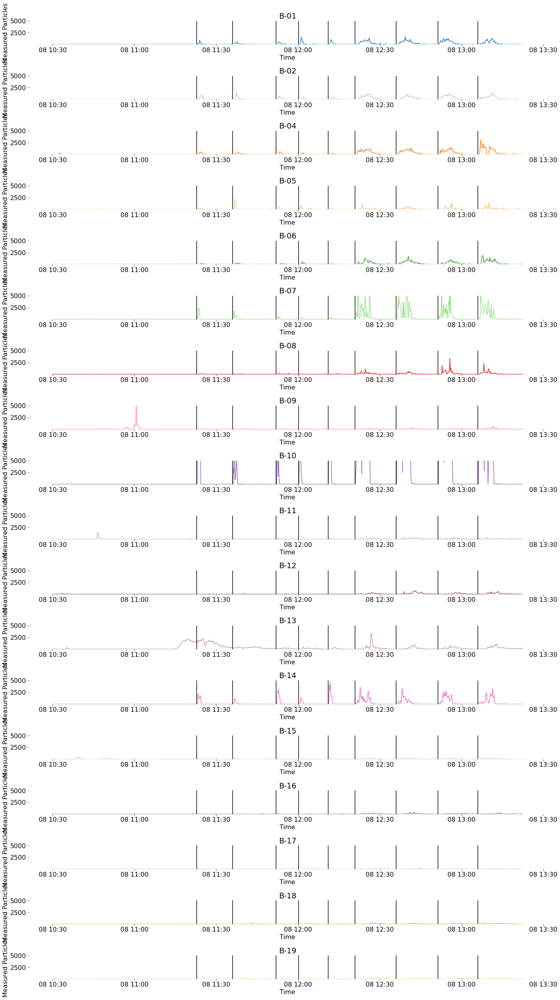

In [108]:

fig,sPlt=plt.subplots(18,sharex=False,sharey=False,figsize=(20,35))
# fig.delaxes(sPlt[1,1])
DataFrame = mergedData

for idx,sensor in enumerate(DataFrame.columns[1:19]):
    yData = (DataFrame[sensor])
    # xData = [i for i in range(-60,len(yData)-60)]
    xData = DataFrame["Date_Time"]

    sPlt[idx].plot(xData,yData,color = color[idx],label = sensor)

    # sPlt[idx].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
    # sPlt[idx].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 
    sPlt[idx].set(title=sensor,xlabel='Time',ylabel='Measured Particles')
    for time in expTimes:
        sPlt[idx].plot([time]*2,[1,5000],color="black")

for ax in sPlt:
    ax.spines["top"].set_visible(False)   
    ax.spines["bottom"].set_visible(False)    
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(False) 
    # ax.legend(prop={'size':9})
    ax.set_ylim([1,5000])
    # ax.set_yscale("log")

    
    
plt.tight_layout()
plt.rcParams.update({'font.size':16})
mpld3.save_html(fig,'IndSensors.html')


### Zones Plotted Showing Sensor

In [109]:
InteriorSensors

{'B-01': [1.85, 1],
 'B-02': [1.85, 1],
 'B-04': [4.5, 1],
 'B-05': [7.5, 1],
 'B-06': [7.5, 1],
 'B-07': [4.5, 2],
 'B-08': [6, 2.5],
 'B-09': [9, 2],
 'B-10': [4.9, 3],
 'B-11': [7.6, 3.3],
 'B-12': [7.6, 3.3],
 'B-14': [3.7, 3],
 'B-15': [3.7, 3],
 'B-16': [9, 4],
 'B-17': [4.9, 5],
 'B-18': [1.85, 6],
 'B-19': [4.5, 6],
 'B-20': [4.5, 6],
 'B-21': [7.6, 5.5],
 'B-22': [7.6, 5.5],
 'B-23': [4.5, 0.3]}

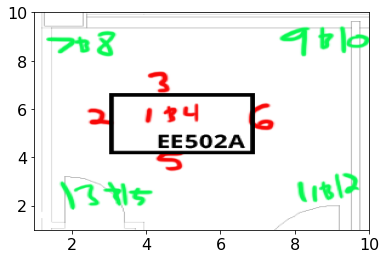

In [110]:
img = mpimg.imread("./Graphs, Images, and Animations/ICU1.png")
imgplot = plt.imshow(img, aspect='auto', extent=(1,10,1,10), alpha=1, zorder=-1)

### Check the Spatial Zoning distribution

In [111]:
if re.match('EE502',key):
    print('match')
else:
    print('no match')

no match


# ZoneAssignments.keys()
ISC = InteriorSensors
# fig,sPlt=plt.subplots(2,2,sharex=False,sharey=False,figsize=(10,10))
for iteration,key in enumerate(ZoneAssignments.keys()):
    x=[]
    y=[]
    points = []
    for idx,sensor in enumerate(InteriorSensors):
        points.append(ISC[sensor])
    vor = Voronoi(points)
    regions, vertices = voronoi_finite_polygons_2d(vor)
    polygons = []
    for reg in regions:
        polygon = vertices[reg]
        polygons.append(polygon)

    plt.figure(figsize=(5,5))
    if re.match('EE502',key):
        route = './Graphs, Images, and Animations/ICU1.png'
    else:
        route = './Graphs, Images, and Animations/ICU2.png'
    img = mpimg.imread(route)
    plt.imshow(img, aspect='auto', extent=(0,10,0,11), alpha=1, zorder=-1)
    ax = plt.subplot(111)

    # Remove ticks
    ax.set_xticks([])
    ax.set_yticks([])

    ax.axis("equal")

    # Set limits
    ax.set_xlim(0,10)
    ax.set_ylim(0,11)

    # Add polygons 
    for idx,poly in enumerate(polygons):
        colored_cell = Polygon(poly,linewidth=0.7, alpha=0.5,facecolor=color[ZoneAssignments[key][idx]*2],edgecolor="black")
        ax.add_patch(colored_cell)
    plt.title(key)
    # got lazy here and explicitly defined the zones
    legend_elements = [Patch(facecolor=color[1], edgecolor='black',label='Zone 1'),
                       Patch(facecolor=color[3], edgecolor='black',label='Zone 2'),
                       Patch(facecolor=color[5], edgecolor='black',label='Zone 3'),
                       Patch(facecolor=color[7], edgecolor='black',label='Zone 4'),]
    plt.legend(handles = legend_elements,bbox_to_anchor=(1.05, .9))
    plt.show()
    # voronoi_plot_2d(vor)
        # sPlt[iteration%2][0 if iteration < 2 else 1].plot(X,Y,'o',color = C,mew = 10)


    


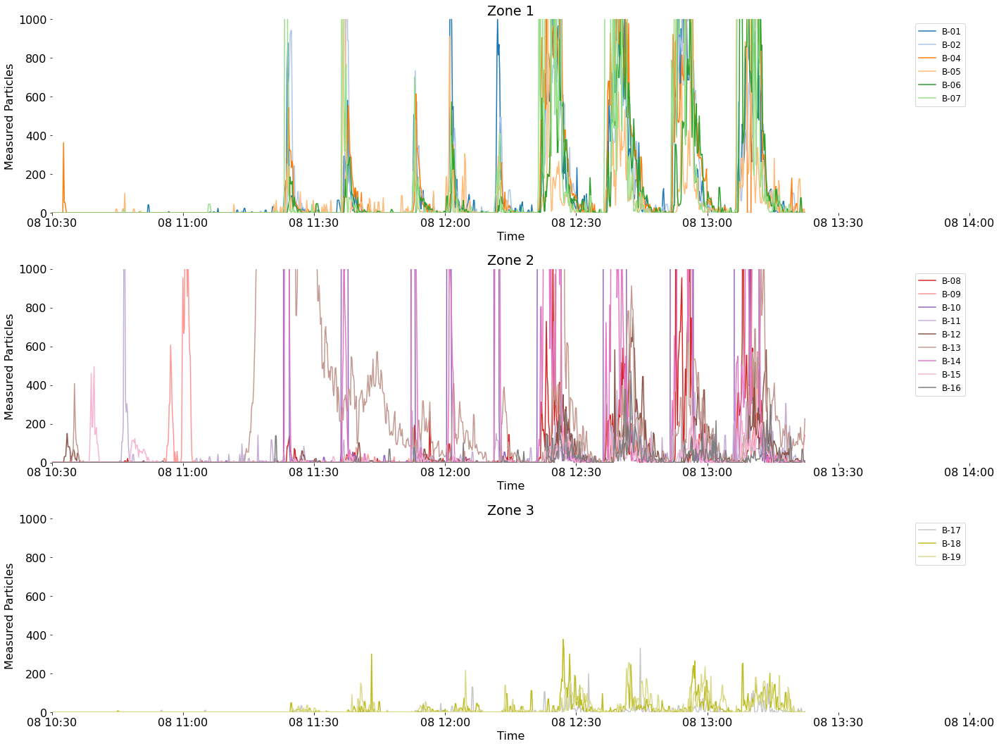

In [112]:

fig,sPlt=plt.subplots(3,sharex=False,sharey=False,figsize=(20,15))
# fig.delaxes(sPlt[1,1])
DataFrame = mergedData

for idx,sensor in enumerate(DataFrame.columns[1:19]):
    if sensor in ['S-02','S-03','S-05']:
        continue
    if idx < 6:
        num = 0
    elif idx < 15:
        num = 1
    else:
        num = 2

    yData = DataFrame[sensor]
    xData = DataFrame["Date_Time"]

    sPlt[num].plot(xData,yData,color = color[idx],label = sensor)

for i in range(3):

    sPlt[i].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
    sPlt[i].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 
    sensor = ['Zone 1','Zone 2','Zone 3']
    sPlt[i].set(title=sensor[i],xlabel='Time',ylabel='Measured Particles')
    
    # yData = DataFrame[DataFrame.keys()[21+i*2]]
    # xData = DataFrame["Date_Time"]
    # sPlt[i].plot(xData,yData,color = "Black",label = "Average",linewidth=2)
    # sPlt[i].grid(color='black', linestyle='--', linewidth=.1)



for ax in sPlt:
    ax.spines["top"].set_visible(False)   
    ax.spines["bottom"].set_visible(False)    
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(False) 
    ax.legend(prop={'size':12})
    # ax.legend(loc="upper right")
    ax.set_ylim([0,10**3])
    ax.set_xlim([pd.Timestamp("8-8-20 10:30"),pd.Timestamp('8-8-20 14:00')])
    # ax.set_yscale("log")
    ax.yaxis.set_major_formatter(ScalarFormatter())

    
    
plt.tight_layout()
plt.rcParams.update({'font.size':16})


## Plots of Avg Zone reading with Avg sensor reading

In [113]:
# stExpDf[key + ' Exp '+str(i)]#[sensors[idx]]
# numExps
# [i for i,s in enumerate(stExpDf.keys()) if key in s]
# stExpDf.keys()

In [114]:
location_x = [1.85, 1.85, 4.5, 4.5, 7.5, 7.5, 4.5, 6,  9, 4.9, 7.6, 7.6, 1.85, 3.7, 3.7, 9, 4.9, 1.85, 4.5, 4.5, 7.6, 7.6, 4.5]
location_y = [1, 1, 1, 1, 1, 1, 2, 2.5, 2, 3, 3.3, 3.3, 4, 3, 3, 4, 5, 6, 6, 6, 5.5, 5.5, 0.3]
location_z = [0.3, 1.5, 0.3, 1.5, 0.3, 1.5, 0.8, 1.5, 1.5, 0.8, 0.3, 1.5, 1.5, 0.3, 1.5, 1.5, 0.8, 0.3, 0.3, 1.5, 0.3, 1.5, 0.8]
len(location_x)
sensorList = ["\"B-"+str(a)+"\"" for a in range(1,len(location_x)+1)]
print("{")
for num,sensor in enumerate(sensorList):
    xyzLs = [location_x[num],location_y[num],location_z[num]]
    print(sensor,":",xyzLs,",")

print("}")


{
"B-1" : [1.85, 1, 0.3] ,
"B-2" : [1.85, 1, 1.5] ,
"B-3" : [4.5, 1, 0.3] ,
"B-4" : [4.5, 1, 1.5] ,
"B-5" : [7.5, 1, 0.3] ,
"B-6" : [7.5, 1, 1.5] ,
"B-7" : [4.5, 2, 0.8] ,
"B-8" : [6, 2.5, 1.5] ,
"B-9" : [9, 2, 1.5] ,
"B-10" : [4.9, 3, 0.8] ,
"B-11" : [7.6, 3.3, 0.3] ,
"B-12" : [7.6, 3.3, 1.5] ,
"B-13" : [1.85, 4, 1.5] ,
"B-14" : [3.7, 3, 0.3] ,
"B-15" : [3.7, 3, 1.5] ,
"B-16" : [9, 4, 1.5] ,
"B-17" : [4.9, 5, 0.8] ,
"B-18" : [1.85, 6, 0.3] ,
"B-19" : [4.5, 6, 0.3] ,
"B-20" : [4.5, 6, 1.5] ,
"B-21" : [7.6, 5.5, 0.3] ,
"B-22" : [7.6, 5.5, 1.5] ,
"B-23" : [4.5, 0.3, 0.8] ,
}


In [115]:
zoneList = {
    'Zone 1' : ['B-10','B-17'],
    'Zone 2' : ['B-07','B-08','B-14','B-15','B-19','B-20'],
    'Zone 3' : ['B-01','B-02','B-13','B-18','B-23','B-04','B-05','B-06','B-11','B-12','B-21','B-22','B-16','B-09']
}

In [116]:
ZoneAssignments["HMC Expirement 1"]

0     2
1     2
2     2
3     2
4     2
5     1
6     1
7     2
8     0
9     2
10    2
11    2
12    1
13    1
14    2
15    1
16    2
17    2
18    2
19    2
20    2
21    2
Name: HMC Expirement 1, dtype: int64

In [117]:
ZoneAssignments['HMC Expirement 3'][21]

2

In [118]:
location_y.pop(2)
len(location_y)

22

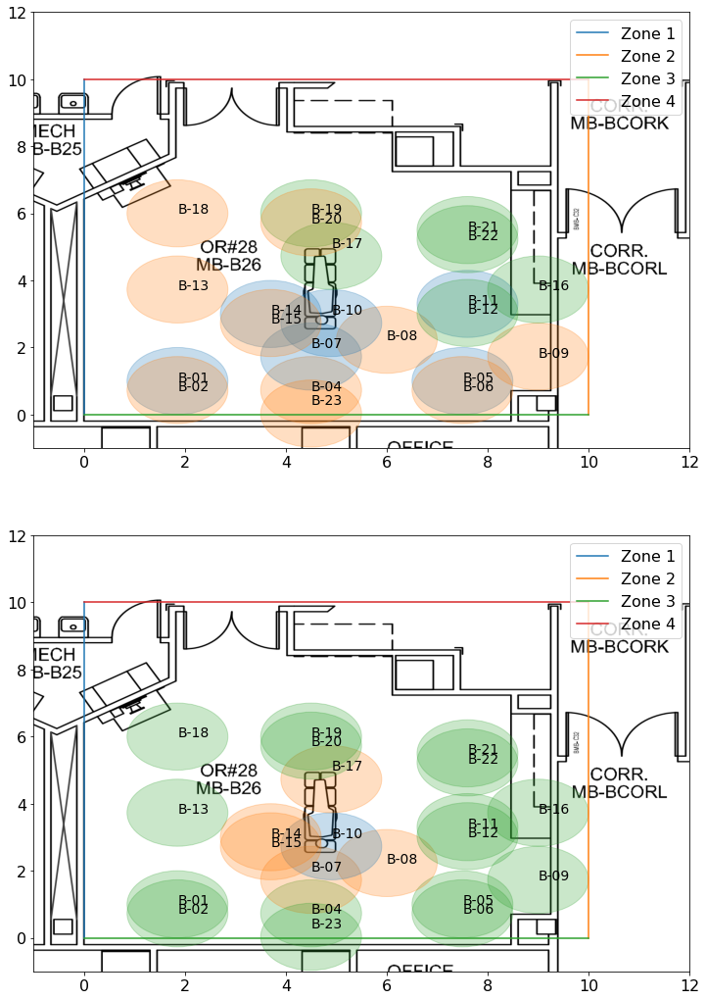

In [119]:
location_x = [1.85, 1.85, 4.5, 4.5, 7.5, 7.5, 4.5, 6,  9, 4.9, 7.6, 7.6, 1.85, 3.7, 3.7, 9, 4.9, 1.85, 4.5, 4.5, 7.6, 7.6, 4.5]
location_y = [1, 1, 1, 1, 1, 1, 2, 2.5, 2, 3, 3.3, 3.3, 4, 3, 3, 4, 5, 6, 6, 6, 5.5, 5.5, 0.3]
location_z = [0.3, 1.5, 0.3, 1.5, 0.3, 1.5, 0.8, 1.5, 1.5, 0.8, 0.3, 1.5, 1.5, 0.3, 1.5, 1.5, 0.8, 0.3, 0.3, 1.5, 0.3, 1.5, 0.8]
sensors = list(stAvgDf['HMC Expirement 1'].keys()[0:22])
# sensors.insert(2,'B-03')
# sensors.insert(12,"B-13")
# location_x.pop(12)
location_x.pop(2)
# location_y.pop(12)
location_y.pop(2)
# location_z.pop(12)
location_z.pop(2)
fig,sPlt = plt.subplots(2,figsize=(12,18))
for auto,ax in enumerate(sPlt):
    if not auto:
        ZoneFrame = AutoZoneAssignments
    else:
        ZoneFrame = ZoneAssignments
    ax.set_ylim([-1,12])
    ax.set_xlim([-1,12])
    ax.plot([0,0],[0,10])
    ax.plot([10,10],[0,10])
    ax.plot([0,10],[0,0])
    ax.plot([0,10],[10,10])
    img = mpimg.imread("./Graphs, Images, and Animations/HMC OR Floor Plan.png")
    imgplot = ax.imshow(img, aspect='auto', extent=(-1,12,-1,12), alpha=1, zorder=-1)
    for idx, y in enumerate(location_y):
        x = location_x[idx]
        y = location_y[idx]
        z = location_z[idx]
        shift = 0
        if z > 0.5:
            shift = .27
        else:
            shift = 0
        # if not (location_z[idx] == .8):
        #     continue
        circle = plt.Circle((x,y-shift),1,alpha = 0.25,color = color[ZoneFrame['HMC Expirement 3'][idx]*2])
        ax.add_patch(circle)
        # ax.plot(location_x[idx]+location_z[idx]/5,y,'o',mew = 20,color = color[ZoneFrame['HMC Expirement 3'][idx]*2])
    for idx, sensor in enumerate(sensors):
        x = location_x[idx]
        y = location_y[idx]
        z = location_z[idx]
        shift = 0
        if z > 0.8:
            shift = .27
        else:
            shift = 0
        # ax.text(location_x[idx]+location_z[idx],location_y[idx],sensor,fontsize = 14, color = color[idx])
        # if not (location_z[idx] == .8):
        #     continue
        # ax.text(location_x[idx],location_y[idx],sensor,fontsize = 14, color = color[ZoneFrame['HMC Expirement 3'][idx]*2])
        ax.text(x,y-shift,sensor,fontsize = 14, color = "black")
    for i in range(4):
        ax.plot(0,0,label='Zone '+str(i+1),color = color[i*2])
    ax.legend(loc='upper right')

plt.savefig(f"C:\\Users\\RobertRochlin\\Documents\\UW\\covidDataProject\\finalImages\\HMC-Zones.jpg")

In [120]:
zoneList = {
    'Zone 1' : ['B-10'],
    'Zone 2' : ['B-17','B-14','B-15','B-07','B-08'],
    'Zone 3' : ['B-01','B-02','B-13','B-18','B-23','B-04','B-05','B-06','B-11','B-12','B-21','B-22','B-16','B-09','B-19','B-20']
}

In [121]:
trails = list(stExpDf.keys())
expirements = list(stAvgDf.keys())
[i for i in trails if expirements[0] in i]



['HMC Expirement 1 Exp 1', 'HMC Expirement 1 Exp 2', 'HMC Expirement 1 Exp 3']

0     0
1     2
2     1
3     0
4     1
5     0
6     1
7     2
8     0
9     0
10    3
11    2
12    0
13    2
14    3
15    3
16    2
17    3
18    2
19    3
20    3
21    1
Name: HMC Expirement 1, dtype: int64

In [122]:

sensors
print("{")
for idx,sensor in enumerate(sensors):
    print("\"" + sensor + "\":",ZoneAssignments["HMC Expirement 1"][idx]+1,",")

{
"B-01": 3 ,
"B-02": 3 ,
"B-04": 3 ,
"B-05": 3 ,
"B-06": 3 ,
"B-07": 2 ,
"B-08": 2 ,
"B-09": 3 ,
"B-10": 1 ,
"B-11": 3 ,
"B-12": 3 ,
"B-13": 3 ,
"B-14": 2 ,
"B-15": 2 ,
"B-16": 3 ,
"B-17": 2 ,
"B-18": 3 ,
"B-19": 3 ,
"B-20": 3 ,
"B-21": 3 ,
"B-22": 3 ,
"B-23": 3 ,


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


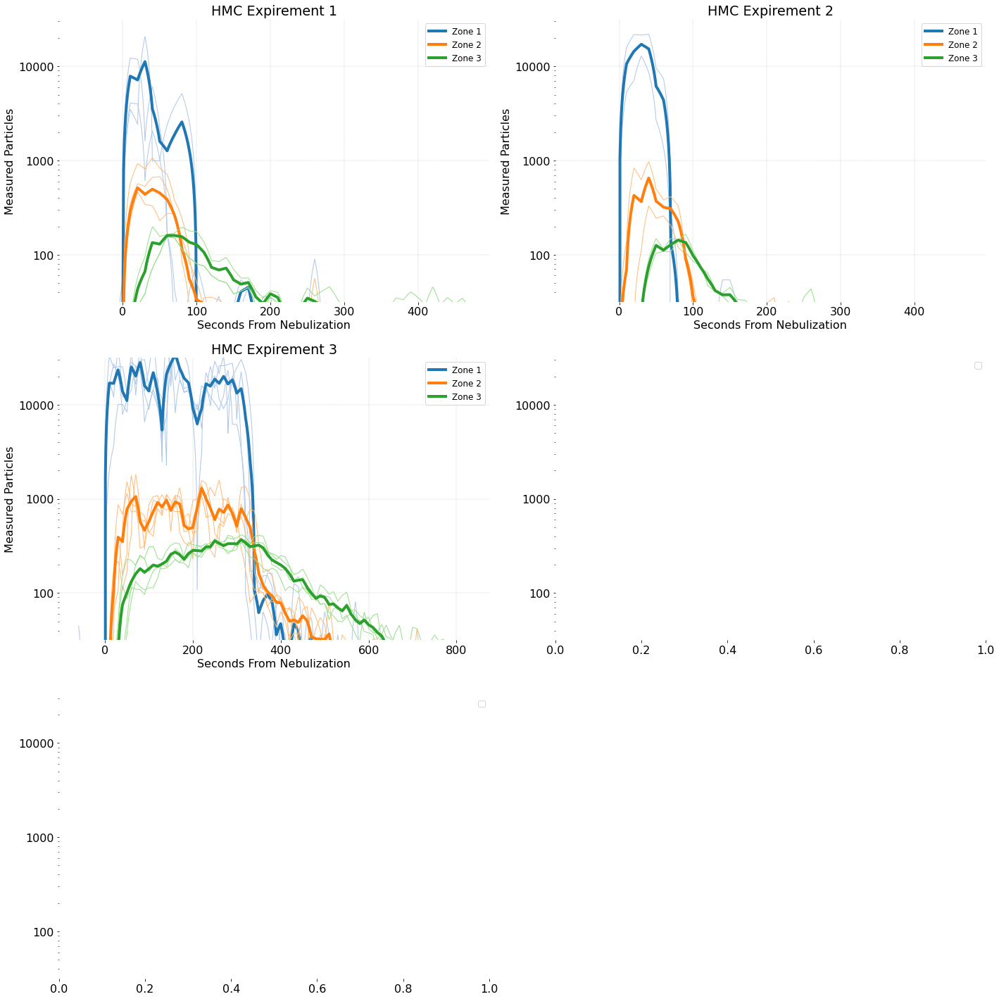

In [123]:

size = len(stAvgDf)
fig,sPlt=plt.subplots(3,2,sharex=False,sharey=False,figsize=(20,20))
#fig.suptitle("March 22nd Data",fontsize=30)
numZones = len(set(ZoneAssignments.iloc[:,1]))

zones = ['Zone '+str(i+1) for i in range(numZones)]
trails = list(stExpDf.keys())
zoneFrame = {}
for iteration,key in enumerate(stAvgDf):
    # fig.delaxes(sPlt[1,1])

    DataFrame = stAvgDf[key]
    sensors = list(DataFrame.keys())[:(-2-numZones+1)]
    numExps = len([i for i,s in enumerate(stExpDf.keys()) if key in s])
    zoneFrame[key] = {}
    # creates a zoneFrame, which is a dictionary that will store of the sensor data for each zone for individual sensor plots
    for zone in range(numZones):
        zoneFrame[key][zone] = pd.DataFrame()

    for idx,zone in enumerate(ZoneAssignments[key]):
        for i in range(numExps):
            # print(idx)
            yData = stExpDf[key + ' Exp '+str(i+1)][sensors[idx]]
            zoneFrame[key][zone][sensors[idx] + ' Exp ' + str(i)] = yData


    for idx in range(numZones):
        # sPlt[i].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
        # sPlt[i].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 

        for trail in [i for i in trails if key in i]:
            # print([0 if iteration < 1 else 1],[iteration%2])
            # print(trail,idx)
            yExpData = stExpDf[trail][zones[idx]]
            xExpData = [i for i in range(-60,len(yData)-60)]
            sPlt[0 if iteration < 2 else 1 if iteration < 4 else 2][iteration%2].plot(xExpData,yExpData,color = color[idx*2+1],linewidth=1)

        yData = DataFrame[zones[idx]]
        yError = np.var(zoneFrame[key][idx],axis = 1)**.5
        xData = [i for i in range(-60,len(yData)-60)]

        # sPlt[iteration].errorbar(xData,yData,yerr=yError,ecolor = color[idx*2+1],color = color[idx*2],label = zones[idx],linewidth=4)

        sPlt[0 if iteration < 2 else 1 if iteration < 4 else 2][iteration%2].plot(xData,yData,color = color[idx*2],label = zones[idx],linewidth=4)

    sPlt[0 if iteration < 2 else 1 if iteration < 4 else 2][iteration%2].grid(color='black', linestyle='--', linewidth=.1)
    sPlt[0 if iteration < 2 else 1 if iteration < 4 else 2][iteration%2].set(title=key,xlabel='Seconds From Nebulization',ylabel='Measured Particles')


    for el in sPlt:
        for ax in el:
            ax.spines["top"].set_visible(False)   
            ax.spines["bottom"].set_visible(False)    
            ax.spines["right"].set_visible(False)    
            ax.spines["left"].set_visible(False) 
            ax.legend(prop={'size':12})
            # ax.legend(loc="upper right")
            ax.set_ylim([10**1.5,10**4.5])
            # ax.set_xlim([pd.Timestamp(startTime),pd.Timestamp(endTime)])
            ax.set_yscale("log")
            ax.yaxis.set_major_formatter(ScalarFormatter())
    # break
        
        
plt.tight_layout()
plt.rcParams.update({'font.size':16})
fig.delaxes(sPlt[2][1])
# plt.savefig(r"C:\Users\RobertRochlin\Documents\UW\covidDataProject\finalImages\Quad_4-20.png")
    # break
# mpld3.save_html(fig,'ZonedVariances.html')



No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


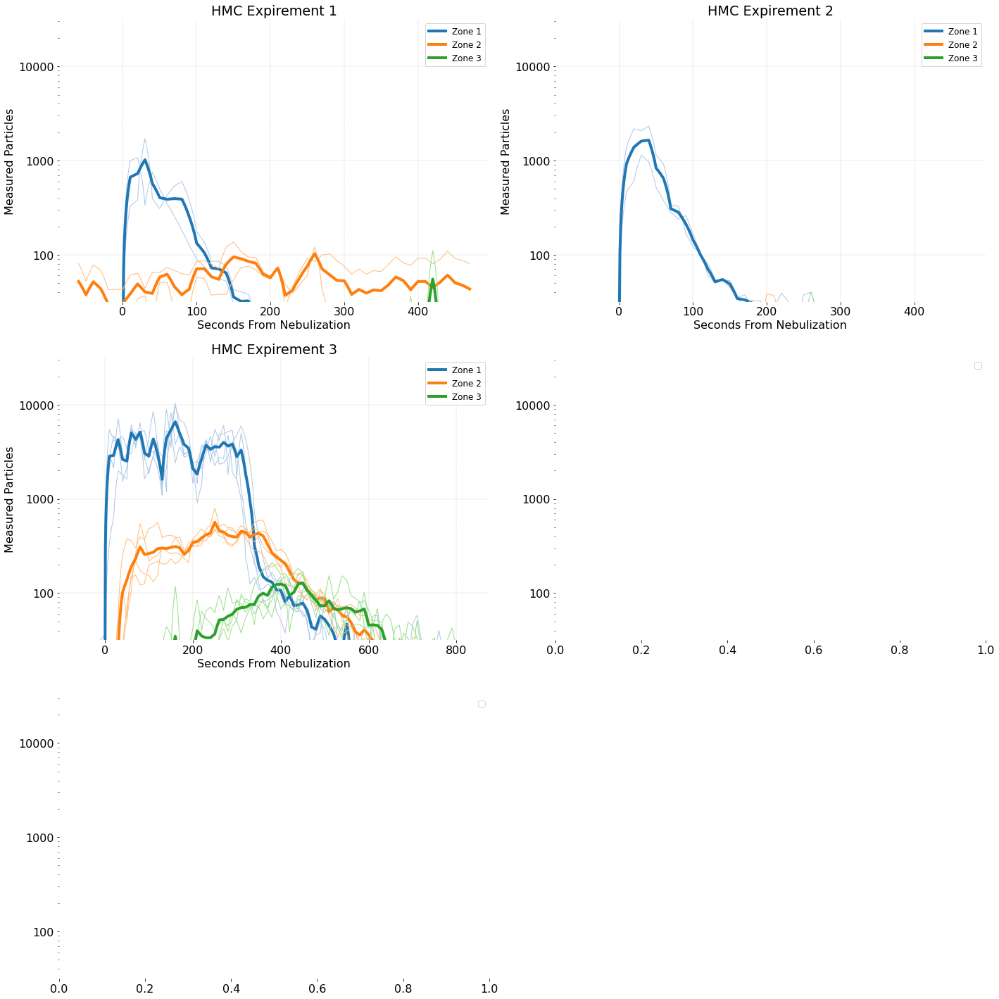

In [124]:

size = len(stAvgDfAuto)
fig,sPlt=plt.subplots(3,2,sharex=False,sharey=False,figsize=(20,20))
#fig.suptitle("March 22nd Data",fontsize=30)
numZones = len(set(AutoZoneAssignments.iloc[:,1]))

zones = ['Zone '+str(i+1) for i in range(numZones)]
trials = list(stExpDfAuto.keys())
zoneFrame = {}
for iteration,key in enumerate(stAvgDfAuto):
    # fig.delaxes(sPlt[1,1])

    DataFrame = stAvgDfAuto[key]
    sensors = list(DataFrame.keys())[:(-2-numZones+1)]
    numExps = len([i for i,s in enumerate(stExpDfAuto.keys()) if key in s])
    zoneFrame[key] = {}
    # creates a zoneFrame, which is a dictionary that will store of the sensor data for each zone for individual sensor plots
    for zone in range(numZones):
        zoneFrame[key][zone] = pd.DataFrame()

    for idx,zone in enumerate(ZoneAssignments[key]):
        for i in range(numExps):
            # print(idx)
            yData = stExpDfAuto[key + ' Exp '+str(i+1)][sensors[idx]]
            zoneFrame[key][zone][sensors[idx] + ' Exp ' + str(i)] = yData


    for idx in range(numZones):
        # sPlt[i].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
        # sPlt[i].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 

        for trial in [i for i in trials if key in i]:
            # print([0 if iteration < 1 else 1],[iteration%2])
            # print(trial,idx)
            yExpData = stExpDfAuto[trial][zones[idx]]
            xExpData = [i for i in range(-60,len(yData)-60)]
            sPlt[0 if iteration < 2 else 1 if iteration < 4 else 2][iteration%2].plot(xExpData,yExpData,color = color[idx*2+1],linewidth=1)

        yData = DataFrame[zones[idx]]
        yError = np.var(zoneFrame[key][idx],axis = 1)**.5
        xData = [i for i in range(-60,len(yData)-60)]

        # sPlt[iteration].errorbar(xData,yData,yerr=yError,ecolor = color[idx*2+1],color = color[idx*2],label = zones[idx],linewidth=4)

        sPlt[0 if iteration < 2 else 1 if iteration < 4 else 2][iteration%2].plot(xData,yData,color = color[idx*2],label = zones[idx],linewidth=4)

    sPlt[0 if iteration < 2 else 1 if iteration < 4 else 2][iteration%2].grid(color='black', linestyle='--', linewidth=.1)
    sPlt[0 if iteration < 2 else 1 if iteration < 4 else 2][iteration%2].set(title=key,xlabel='Seconds From Nebulization',ylabel='Measured Particles')


    for el in sPlt:
        for ax in el:
            ax.spines["top"].set_visible(False)   
            ax.spines["bottom"].set_visible(False)    
            ax.spines["right"].set_visible(False)    
            ax.spines["left"].set_visible(False) 
            ax.legend(prop={'size':12})
            # ax.legend(loc="upper right")
            ax.set_ylim([10**1.5,10**4.5])
            # ax.set_xlim([pd.Timestamp(startTime),pd.Timestamp(endTime)])
            ax.set_yscale("log")
            ax.yaxis.set_major_formatter(ScalarFormatter())
    # break
        
        
plt.tight_layout()
plt.rcParams.update({'font.size':16})
fig.delaxes(sPlt[2][1])
# plt.savefig(r"C:\Users\RobertRochlin\Documents\UW\covidDataProject\finalImages\Quad_4-20.png")
    # break
# mpld3.save_html(fig,'ZonedVariances.html')



0
1


In [125]:
AutoZoneAssignments

,HMC Expirement 1,HMC Expirement 2,HMC Expirement 3
0,0,0,0
1,0,0,1
2,0,0,1
3,0,0,0
4,0,0,1
5,0,0,0
6,1,1,1
7,0,2,1
8,0,0,0
9,0,0,0


In [126]:
print(re.search('Expirement 3',name))

<re.Match object; span=(4, 16), match='Expirement 3'>


891

531
531
891


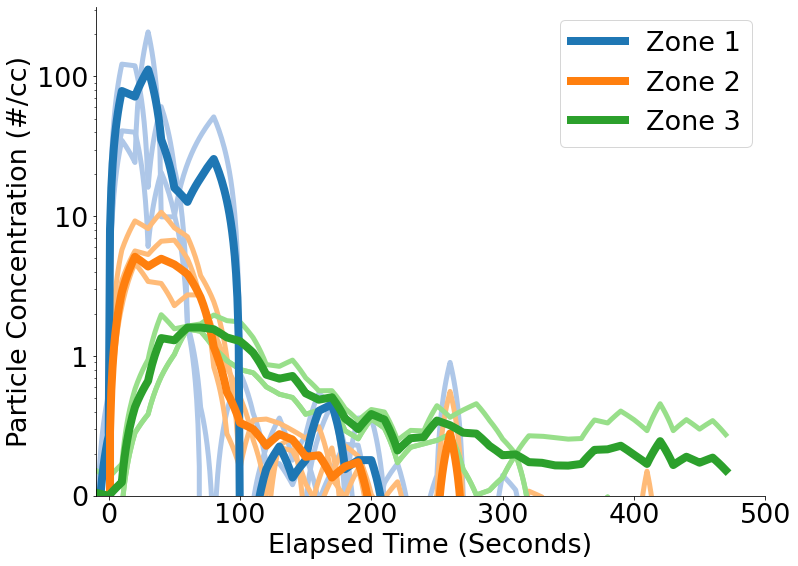

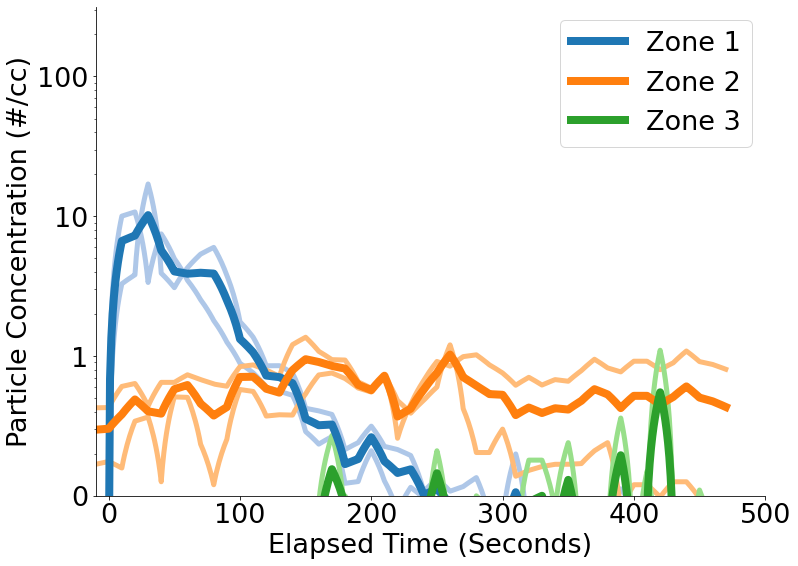

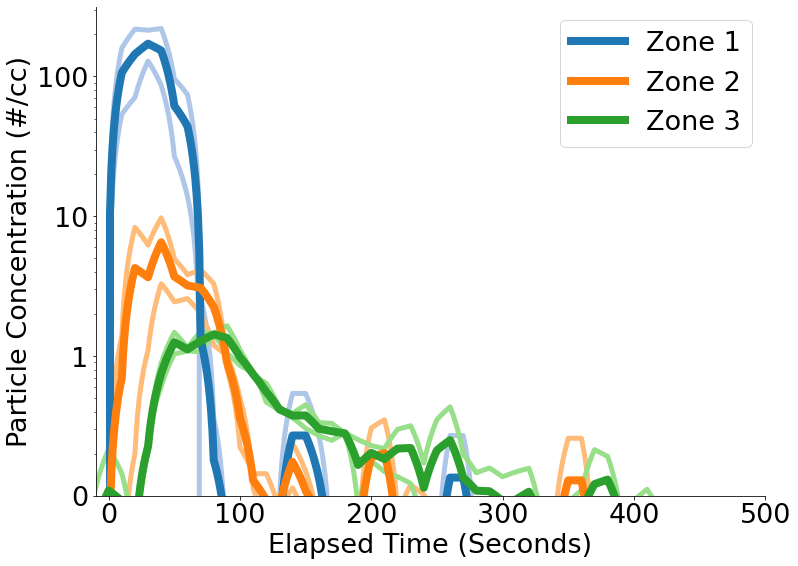

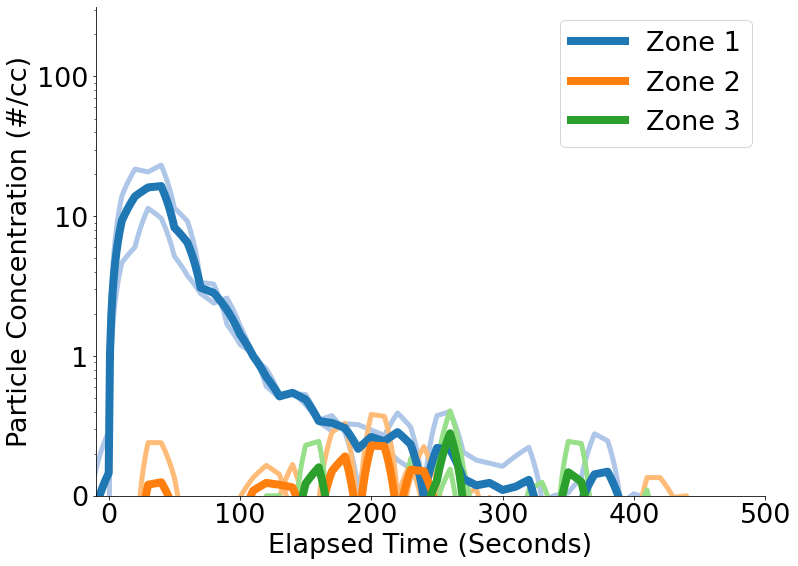

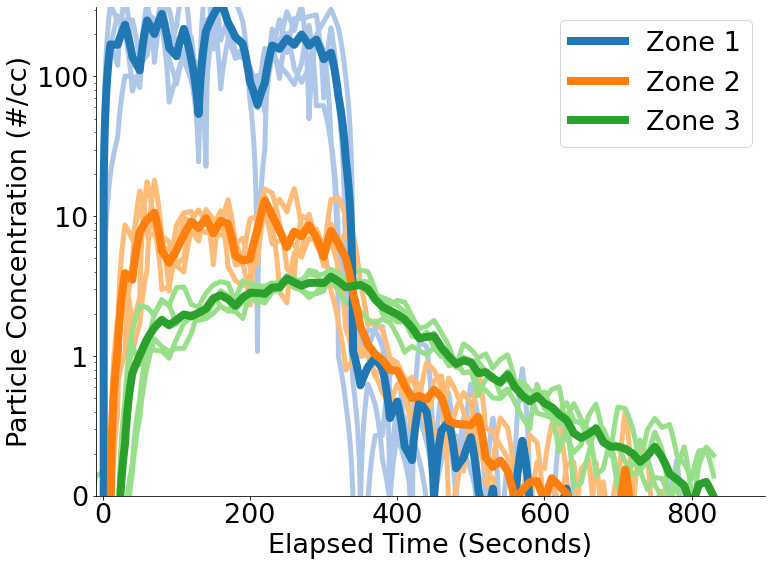

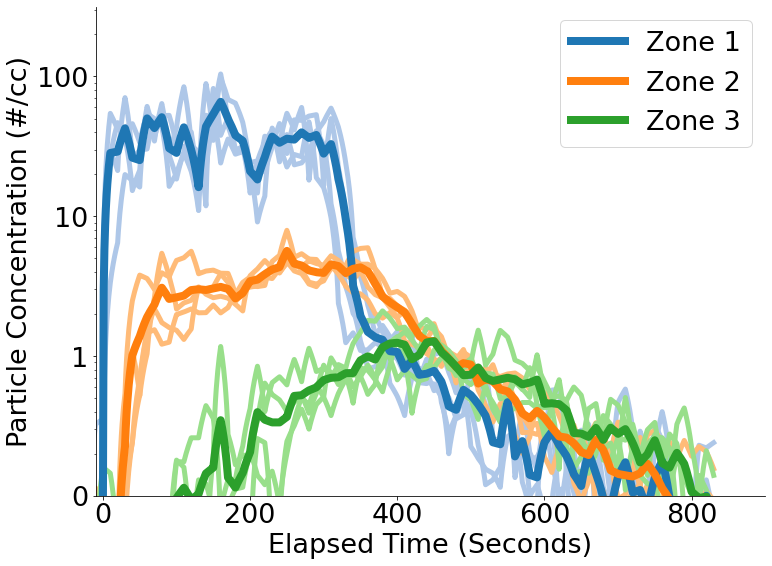

In [138]:
for nameNum in range(len(stAvgDf.keys())):

    #Just going to plot OR 
    names = list(stAvgDf.keys())
    fig = plt.figure(figsize=(12,9))
    ax = fig.gca()
    name = names[nameNum]
    key = name.split(" Exp ")[0]



    # dFrame = stExpDf[name]
    dFrame = stAvgDf[key]

    for zone in range(numZones):
        yData = dFrame['Zone '+str(zone+1)]/100
        xData = np.array([i for i in range(-60,len(yData)-60)])
        for trail in [i for i in trails if key in i]:
            # print([0 if iteration < 1 else 1],[iteration%2])
            # print([200 if trail =="OR 12 Unblocked Exp 3" else 0][0])
            try:
                yExpData = stExpDf[trail]['Zone '+str(zone+1)]/100
                xExpData = np.array([i for i in range(-60,len(yData)-60)])#+[30 if trail =="OR 12 Blocked Exp 3" else 0][0]
                plt.plot(xExpData,yExpData,color = color[zone*2+1],linewidth=5)
            except:
                print(trail,'Zone '+str(zone+1),"data not available")
                continue
    for zone in range(numZones):
        yData = dFrame['Zone '+str(zone+1)]/100
        xData = np.array([i for i in range(-60,len(yData)-60)])
        plt.plot(xData,yData,color = color[zone*2],label = 'Zone '+str(zone+1),linewidth=8)
    plt.rcParams.update({'font.size':18})
    # plt.plot([5]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75,label = 'Snapshot')
    # plt.plot([30]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75)
    # plt.plot([300]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75)
    plt.legend()
    ax.set(xlabel='Elapsed Time (Seconds)',ylabel='Particle Concentration (#/cc)')
    ax.spines["top"].set_visible(False)   
    ax.spines["bottom"].set_visible(True)
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(True) 
    ax.legend(prop={'size':27})
    # ax.legend(loc="upper right")
    ax.set_ylim([10**-1,10**2.5])
    ax.set_xlim([-10,round(len(xData)/100)*100])
    print(len(xData))
    ax.set_yscale("log")
    ax.yaxis.set_major_formatter(ScalarFormatter())
    plt.rcParams.update({'font.size':27})

    # plt.savefig(f"C:\\Users\\RobertRochlin\\Documents\\UW\\covidDataProject\\finalImages\\totalORs\\Manual\\{key.replace(' ','_')}.jpg")

    #Just going to plot OR 

    ### AUTO PLOTS 
    names = list(stAvgDf.keys())

    fig = plt.figure(figsize=(12,9))
    ax = fig.gca()
    name = names[nameNum]
    key = name.split(" Exp ")[0]
    trials = list(stExpDfAuto.keys())


    # dFrame = stExpDf[name]
    dFrame = stAvgDfAuto[key]
    expDFrame = stExpDfAuto

    for zone in range(numZones):
        yData = dFrame['Zone '+str(zone+1)]/100
        xData = np.array([i for i in range(-60,len(yData)-60)])
        for trial in [i for i in trials if key in i]:
            # print([0 if iteration < 1 else 1],[iteration%2])
            # print([200 if trial =="OR 12 Unblocked Exp 3" else 0][0])
            yExpData = expDFrame[trial]['Zone '+str(zone+1)]/100
            xExpData = np.array([i for i in range(-60,len(yData)-60)])#+[30 if trial =="OR 12 Blocked Exp 3" else 0][0]
            plt.plot(xExpData,yExpData,color = color[zone*2+1],linewidth=5)
    for zone in range(numZones):
        yData = dFrame['Zone '+str(zone+1)]/100
        xData = np.array([i for i in range(-60,len(yData)-60)])
        plt.plot(xData,yData,color = color[zone*2],label = 'Zone '+str(zone+1),linewidth=8)

    plt.rcParams.update({'font.size':18})
    # plt.plot([5]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75,label = 'Snapshot')
    # plt.plot([30]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75)
    # plt.plot([300]*2,[0,10**2.5],color='black',linestyle='--',linewidth=.75)
    plt.legend()
    ax.set(xlabel='Elapsed Time (Seconds)',ylabel='Particle Concentration (#/cc)')
    ax.spines["top"].set_visible(False)   
    ax.spines["bottom"].set_visible(True)
    ax.spines["right"].set_visible(False)    
    ax.spines["left"].set_visible(True) 
    ax.legend(prop={'size':27})
    # ax.legend(loc="upper right")
    ax.set_ylim([10**-1,10**2.5])
    ax.set_xlim([-10,round(len(xData)/100)*100])
    ax.set_yscale("log")
    ax.yaxis.set_major_formatter(ScalarFormatter())
    plt.rcParams.update({'font.size':27})

    # plt.savefig(f"C:\\Users\\RobertRochlin\\Documents\\UW\\covidDataProject\\finalImages\\totalORs\\Auto\\Auto{key.replace(' ','_')}.jpg")



In [470]:
zoneTracker={}
for key in ZoneAssignments:
    for idx,zone in enumerate(ZoneAssignments[key]):
        print(sensors[idx],zone)

B-01 2
B-02 2
B-04 2
B-05 2
B-06 2
B-07 1
B-08 1
B-09 2
B-10 0
B-11 2
B-12 2
B-13 2
B-14 1
B-15 1
B-16 2
B-17 1
B-18 2
B-19 2
B-20 2
B-21 2
B-22 2
B-23 2
B-01 2
B-02 2
B-04 2
B-05 2
B-06 2
B-07 1
B-08 1
B-09 2
B-10 0
B-11 2
B-12 2
B-13 2
B-14 1
B-15 1
B-16 2
B-17 1
B-18 2
B-19 2
B-20 2
B-21 2
B-22 2
B-23 2
B-01 2
B-02 2
B-04 2
B-05 2
B-06 2
B-07 1
B-08 1
B-09 2
B-10 0
B-11 2
B-12 2
B-13 2
B-14 1
B-15 1
B-16 2
B-17 1
B-18 2
B-19 2
B-20 2
B-21 2
B-22 2
B-23 2


<AxesSubplot:>

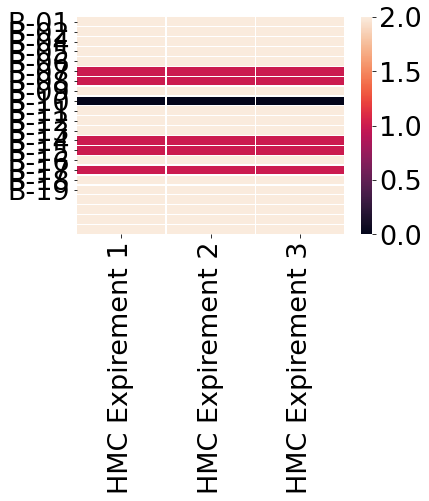

In [471]:
sns.heatmap(ZoneAssignments,yticklabels = sensors[:-5],label='x-small',linecolor='white',linewidths=.25)

In [472]:
indexList = {}
thresh = 2
offset = 60
for notUse,x in enumerate(stAvgDf):
    switch = 0
    for idx,i in enumerate(np.log(stAvgDf[x]['Average'])/np.log(10)):

        if (i >= thresh):
            switch = 1

        if switch and i <= thresh:
            indexList[x] = idx-offset
            switch = 0
            break

    if switch:
        indexList[x] = 600
    print(indexList[x],'seconds',x)

101 seconds HMC Expirement 1
95 seconds HMC Expirement 2
458 seconds HMC Expirement 3


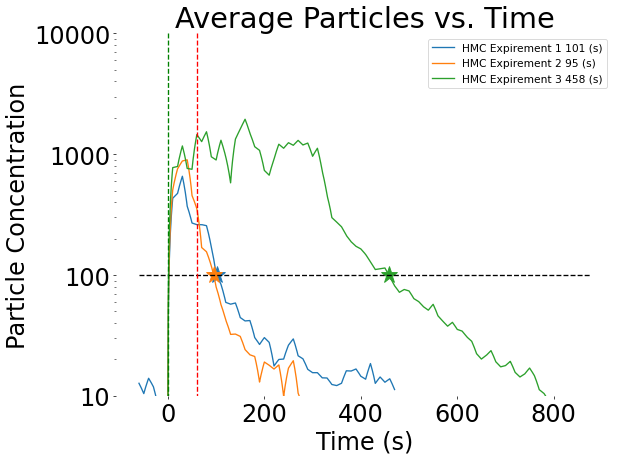

In [473]:
OR = ""
for idx,x in enumerate(stAvgDf):
    if not re.search(OR,x):
        continue
    fig = plt.figure(0, figsize=(10,7.5), dpi=64)
    ax = fig.gca()
    yData = stAvgDf[x]['Average']
    xData = indexList[x]

    ax.plot([i for i in range(-60,len(yData)-60)],yData,color = color[idx*2],label = x + ' ' + str(xData) + ' (s)')

    ax.plot([xData],[10**thresh],'*',ms=20,color = color[idx*2])
    # ax.plot([xData,cData],[0,5])

    # ax.plot([i for i in range(-60,len(yData)-60)],yData,'.')
    # ax.plot([xData,xData],[0,200])

# ax.plot([-60,len(yData)-60],[thresh**3,thresh**3],color = 'white')

## plotting lines here
ax.plot([-60,875],[10**thresh]*2,'--',color = 'black')
ax.plot([0,0],[10**4,1],'--',color = 'green')
ax.plot([60,60],[10**4,1],'--',color = 'red')

plt.yscale("log")

plt.ylim([10,10**4])

ax.legend()
ax.set_xlabel('Time (s)')
ax.set_ylabel('Particle Concentration')
plt.title('Average Particles vs. Time')
ax.spines["top"].set_visible(False)   
ax.spines["bottom"].set_visible(False)    
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(False) 
ax.legend(prop={'size':12})
plt.rcParams.update({'font.size':15})
ax.fill_between([0,60], [1,3], [1,3],facecolor='green',where=True, alpha=0.5)
ax.yaxis.set_major_formatter(ScalarFormatter())
# plt.savefig(r"C:\Users\RobertRochlin\Documents\UW\covidDataProject\finalImages\AvgVsTime\Avg_HMC_8-8_"+OR+".png")
# #For exporting
# mpld3.save_html(fig,'avgParticlePlot27_Thresh.html')

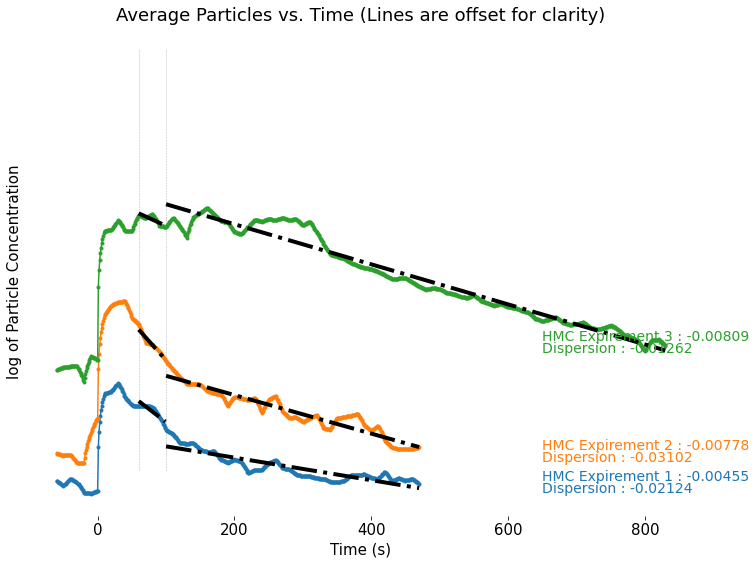

In [474]:
fig = plt.figure(0,figsize=(12,9))
ax = plt.subplot(111)   
ax.get_xaxis().tick_bottom()  
ax.get_yaxis().set_ticks([]) 
ax.spines["top"].set_visible(False)    
ax.spines["bottom"].set_visible(False)    
ax.spines["right"].set_visible(False)    
ax.spines["left"].set_visible(False) 
ax.set_xlabel('Time (s)')
ax.set_ylabel('log of Particle Concentration')
plt.title('Average Particles vs. Time (Lines are offset for clarity)')
plt.plot([60,60], [3,20], "--", lw=0.5, color="black", alpha=0.3)
plt.plot([100,100], [3,20], "--", lw=0.5, color="black", alpha=0.3)
spaceFactor = 3

for idx,x in enumerate(stAvgDf):

    yData = stAvgDf[x]['Average']
    xData = indexList[x]

    yPoints = np.log(stAvgDf[x]['Average'][160:])
    xPoints = np.array([i+100 for i in range(len(yPoints))])
    m,b = np.polyfit(xPoints,yPoints,1)

    yPoints2 = np.log(stAvgDf[x]['Average'][120:160])
    xPoints2 = np.array([i+60 for i in range(40)])
    m2,b2 = np.polyfit(xPoints2,yPoints2,1)
    
    ax.plot([i for i in range(-60,len(yData)-60)],np.log(yData)+idx*spaceFactor,'.-',color = tableau20[idx*2],label = x + ': Coefficient  ' + str(round(m,3)) )

    ax.plot(xPoints,m*xPoints+b+idx*spaceFactor,'-.',color = 'black',linewidth=4)
    ax.plot(xPoints2,m2*xPoints2+b2+idx*spaceFactor,'-.',color = 'black',linewidth=4)
    y_pos = yPoints.values[-20] + idx*spaceFactor
    plt.text(650, y_pos, x + ' : '+str(round(m,5)), fontsize=14, color=tableau20[idx*2])
    plt.text(650, y_pos-.50, 'Dispersion' + ' : '+str(round(m2,5)), fontsize=14, color=tableau20[idx*2])     

# # #For Exporting
# plt.savefig(r"C:\Users\RobertRochlin\Documents\UW\covidDataProject\finalImages\decayRates\AvgPvT8_8.svg")


### Plotting Data for Sensors

In [475]:
ZoneAssignments

,HMC Expirement 1,HMC Expirement 2,HMC Expirement 3
0,2,2,2
1,2,2,2
2,2,2,2
3,2,2,2
4,2,2,2
5,1,1,1
6,1,1,1
7,2,2,2
8,0,0,0
9,2,2,2


No handles with labels found to put in legend.


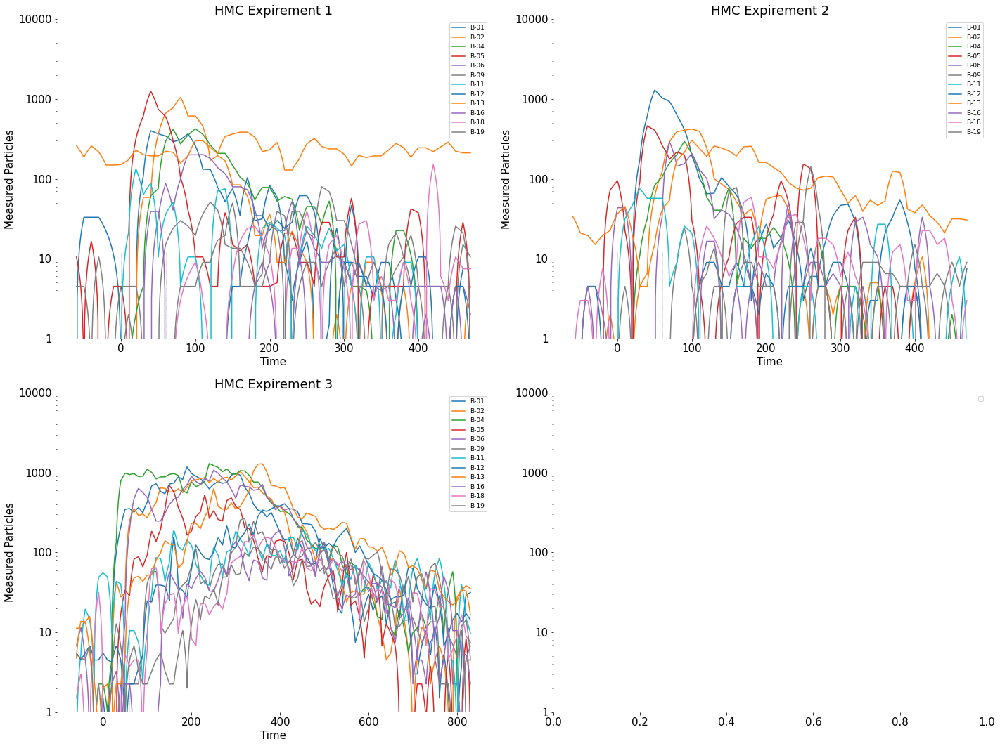

In [476]:

fig,sPlt=plt.subplots(2,2,sharex=False,sharey=False,figsize=(20,15))
# fig.delaxes(sPlt[1,1])
DataFrame = stAvgDf

for idx,x in enumerate(DataFrame):
    for loop,zone in enumerate(DataFrame[x].columns[:18]):
        if not (ZoneAssignments[x][loop] == 2):
            continue
        yData = (DataFrame[x][zone])
        xData = [i for i in range(-60,len(yData)-60)]

        # sPlt[1 if idx > 1 else 0][idx%2].plot(xData,yData,color = color[ZoneAssignments[x][loop]*2],label = zone)
        sPlt[1 if idx > 1 else 0][idx%2].plot(xData,yData,color = color[loop*2],label = zone)

    sPlt[1 if idx > 1 else 0][idx%2].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
    sPlt[1 if idx > 1 else 0][idx%2].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 
    sPlt[1 if idx > 1 else 0][idx%2].set(title=x,xlabel='Time',ylabel='Measured Particles')


for el in sPlt:
    for ax in el:
        ax.spines["top"].set_visible(False)   
        ax.spines["bottom"].set_visible(False)    
        ax.spines["right"].set_visible(False)    
        ax.spines["left"].set_visible(False) 
        ax.legend(prop={'size':9})
        ax.set_ylim([10**0,10**4])
        ax.set_yscale("log")
        ax.yaxis.set_major_formatter(ScalarFormatter())


plt.tight_layout()
plt.rcParams.update({'font.size':22})


### Plotting Data for Zones

No handles with labels found to put in legend.


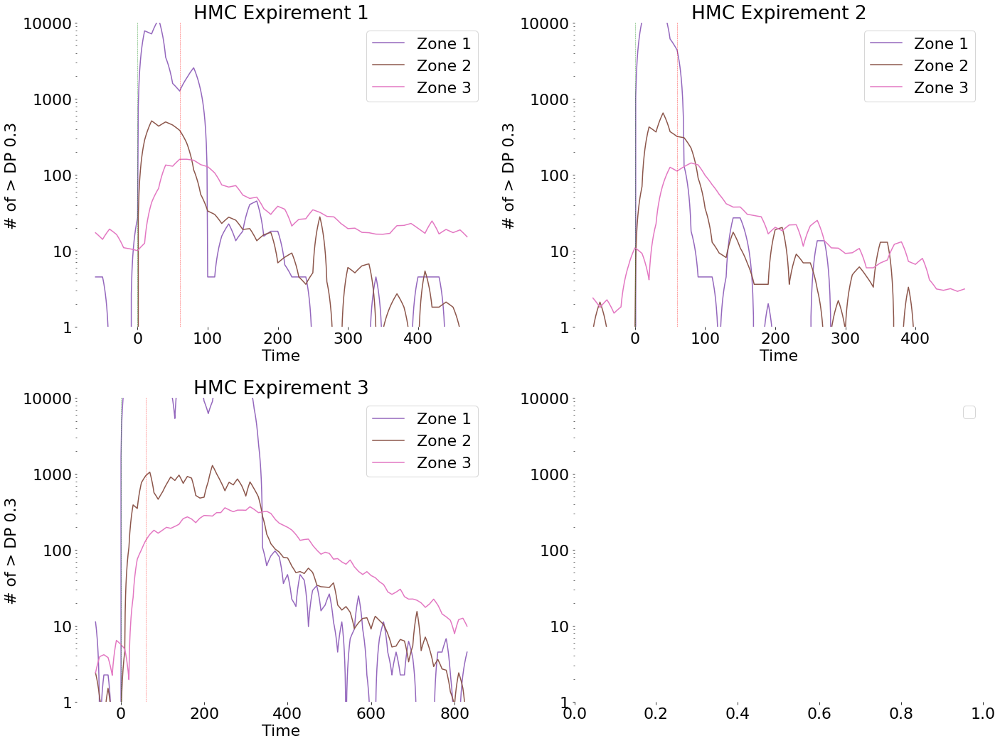

In [477]:

fig,sPlt=plt.subplots(2,2,sharex=False,sharey=False,figsize=(20,15))

DataFrame = stAvgDf
for idx,x in enumerate(DataFrame):
    for loop,zone in enumerate(DataFrame[x].columns[20:]):
        # if True: 

        if re.match(r"Zone",zone):

            yData = (DataFrame[x][zone])
            xData = [i for i in range(-60,len(yData)-60)]

            sPlt[1 if idx > 1 else 0][idx%2].plot(xData,yData,color = color[loop*2],label = zone)
            
    sPlt[1 if idx > 1 else 0][idx%2].plot([60,60], [1,10**4.5], "--", lw=0.5, color="red", alpha=0.75)
    sPlt[1 if idx > 1 else 0][idx%2].plot([0,0], [1,10**4.5], "--", lw=0.5, color="green", alpha=0.75) 
    sPlt[1 if idx > 1 else 0][idx%2].set(title=x,xlabel='Time',ylabel='# of > DP 0.3')


for el in sPlt:
    for ax in el:
        ax.spines["top"].set_visible(False)   
        ax.spines["bottom"].set_visible(False)    
        ax.spines["right"].set_visible(False)    
        ax.spines["left"].set_visible(False) 
        ax.legend()
        ax.set_ylim([10**0,10**4])
        ax.set_yscale("log")
        ax.yaxis.set_major_formatter(ScalarFormatter())

# sPlt[0][1].set(title='OR7 Blocked',xlabel='Time',ylabel='Log of Particle concentration')
# sPlt[0][0].set(title='OR16 Blocked 1')
plt.tight_layout()
plt.rcParams.update({'font.size':16})





In [478]:
DataFrame[x].columns[18:]

Index(['B-20', 'B-21', 'B-22', 'B-23', 'Average', 'Variance', 'Zone 1',
       'Zone 2', 'Zone 3'],
      dtype='object')

No handles with labels found to put in legend.


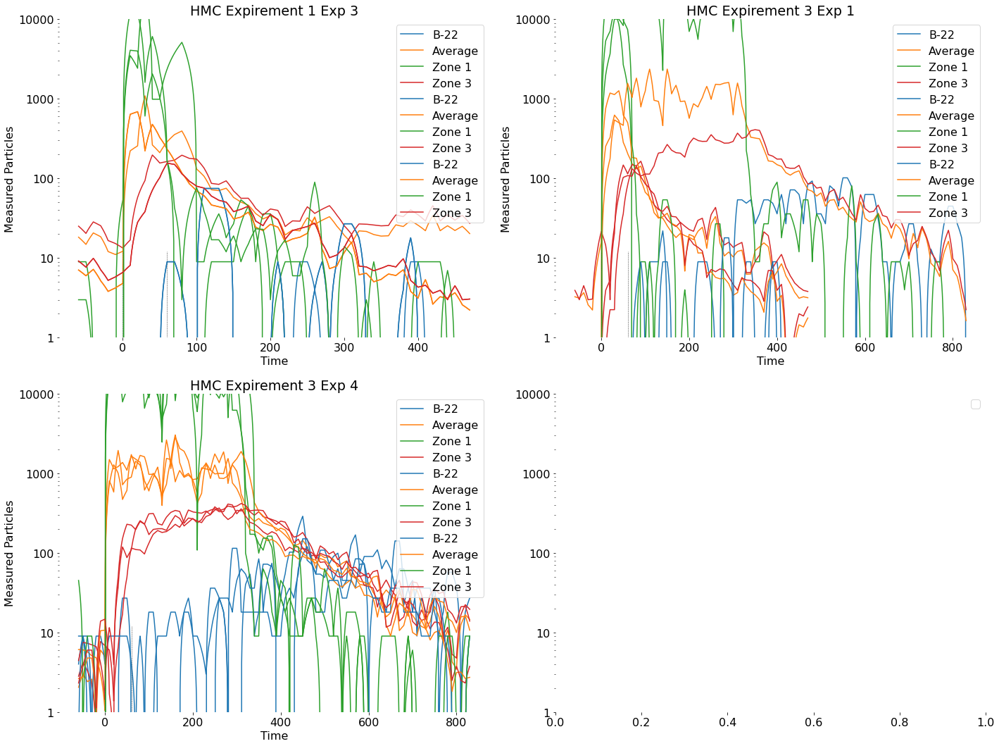

In [479]:

fig,sPlt=plt.subplots(2,2,sharex=False,sharey=False,figsize=(20,15))

DataFrame = stExpDf
for idx,x in enumerate(DataFrame):
    index = math.floor(idx/3)
    yData = DataFrame[x]
    xData = [i for i in range(-60,len(yData)-60)]
    for loop,zone in enumerate(DataFrame[x].columns[20:]):
            if not loop%2:
                sPlt[1 if index > 1 else 0][index%2].plot(xData,yData[zone],color = color[loop],label = zone)

    sPlt[1 if index > 1 else 0][index%2].plot([60,60], [0,12], "--", lw=0.5, color="black", alpha=0.3)
    sPlt[1 if index > 1 else 0][index%2].plot([0,0], [0,12], "--", lw=0.5, color="black", alpha=0.3) 
    sPlt[1 if index > 1 else 0][index%2].set(title=x,xlabel='Time',ylabel='Measured Particles')

for el in sPlt:
    for ax in el:
        ax.spines["top"].set_visible(False)   
        ax.spines["bottom"].set_visible(False)    
        ax.spines["right"].set_visible(False)    
        ax.spines["left"].set_visible(False) 
        ax.legend(loc="upper right")
        ax.set_ylim([10**0,10**4])
        ax.set_yscale("log")
        ax.yaxis.set_major_formatter(ScalarFormatter())
# sPlt[0][1].set(title='OR7 Blocked',xlabel='Time',ylabel='Log of Particle concentration')
# sPlt[0][0].set(title='OR16 Blocked 1')
plt.tight_layout()
plt.rcParams.update({'font.size':16})
